# Week 1: Numerical features (Video part 10)
### Preprocessing
##### a) Tree-based models
There are models that do and don't depend on feature scale, because of this we will roughly group models into 2 categories: tree-based models (doesn't depend on feature scale), non-tree based model (depend on feature scale)
For example, tree-based model tries to find the most useful split for its features and it wont change its behaviour and prediction if we multiply the features with a constant and retrain the model.

##### b) Non tree-based models
- Non-tree models depends on these kinds of transformation. Let's consider a kNN that uses k=1, and we want to predict the class of `?` in the image below.
  - for case 1 (top left), it will predict the `?` as belonging to class `x` because it is nearer than class `o`.
  - but what happend if we multiply feature `x1` by 10? then knn will now predict the `?` as class `o` because now it is nearer.
  - consider an extreme case: what if we multiply feature `x1` by 0, then every instance would have feature value of 0, resulting in kNN ignoring that feature.
  - another extreme case: if we multiply feature `x1` by 1000,000, slightest differences in that feature value will impact predictions and this will make the kNN favor that feature over the others.
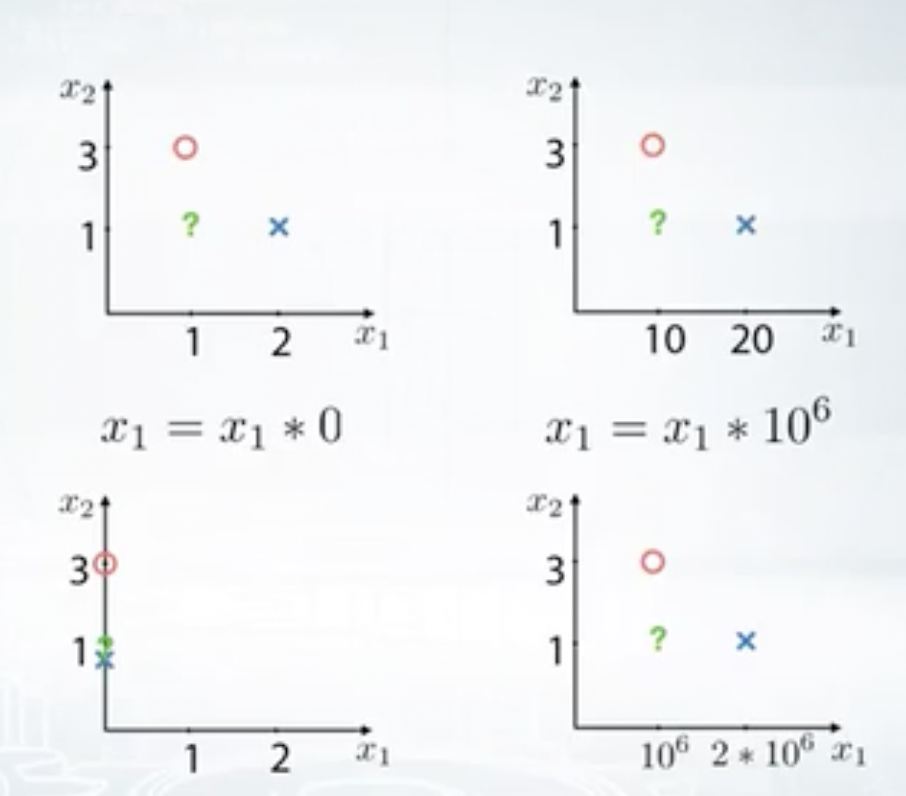
- Linear model also experience difficulties with differently scaled features.
- We want reguarization to be applied linear model scaled features in equal amount. But in fact, regularization's impact turns out to be proportional to feature's scale.
- Gradient descent method can be crazy without proper scaling.
- Due to this, neural networks are similar to linear model in its requirements for feature preprocessing.
- Different features' scaling results in different model's quality. In this sense, it is just another hyperparameter we need to optimize.

##### Scaling
1. Minmax
    - The easiest way to do this is to scale every feature to the same scale (MinMax)
    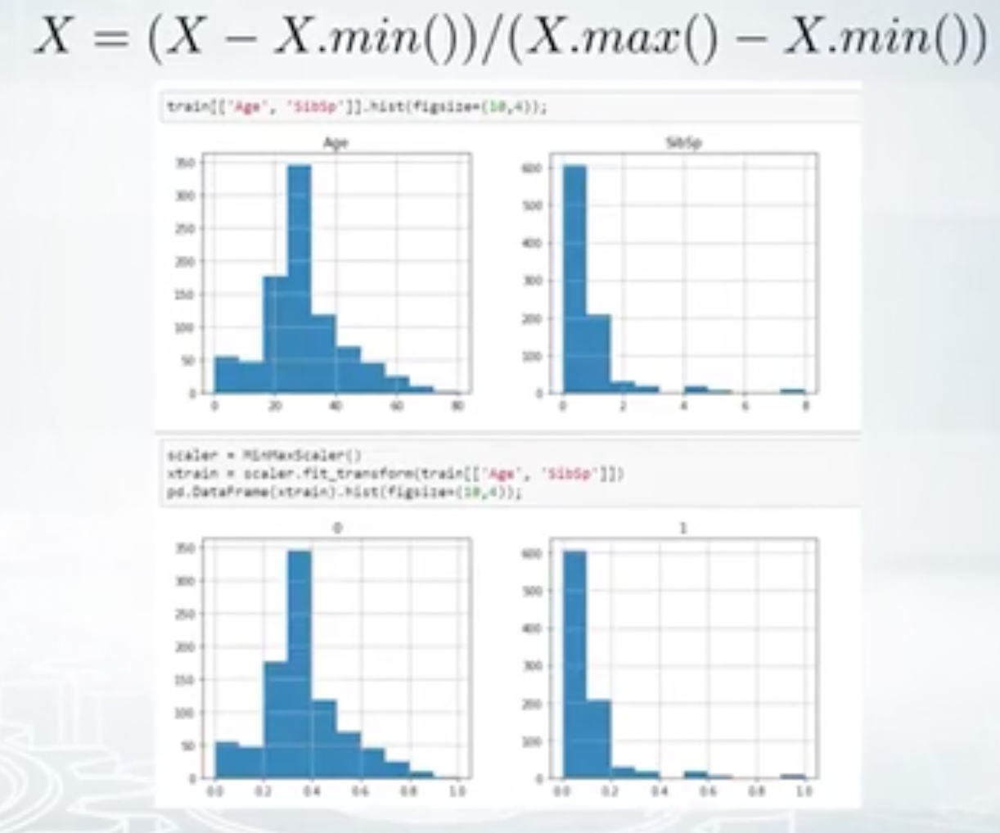
    - Observe the before and after minmax scaling on 2 features: age (range from 0-80), Sibsp (range 0-8). Note that while range of x axis changed after minmax scaling, the distribution of the histogram did not change.
2. StandardScaler
   - To get mean=0, standard dev=1
   - After preprocessing using standard scaler, feature impact on non-tree based model will now be similar.
   - If we want to use kNN, recall that the bigger the feature is, the bigger its impact on kNN's prediction, so we can boost scaling feature to boost feature which we think could be more important for us and see if it helps.


##### Outlier

###### Winsorization
- When we work with linear model, outlier is another factor that influence prediction. Imagine a set of datapoint with a best fitting line (red) shown below, if we have an outlier with some huge value, the best fitting line would shift (purple) [left image]. The same is also true when we have outlier in the target value. For example, imagine we have a training dataset with target value between 0 to 1, what would happen if suddenly we add new training data with target value of 1000, when we retrain the model, the model prediction will be high [right image].

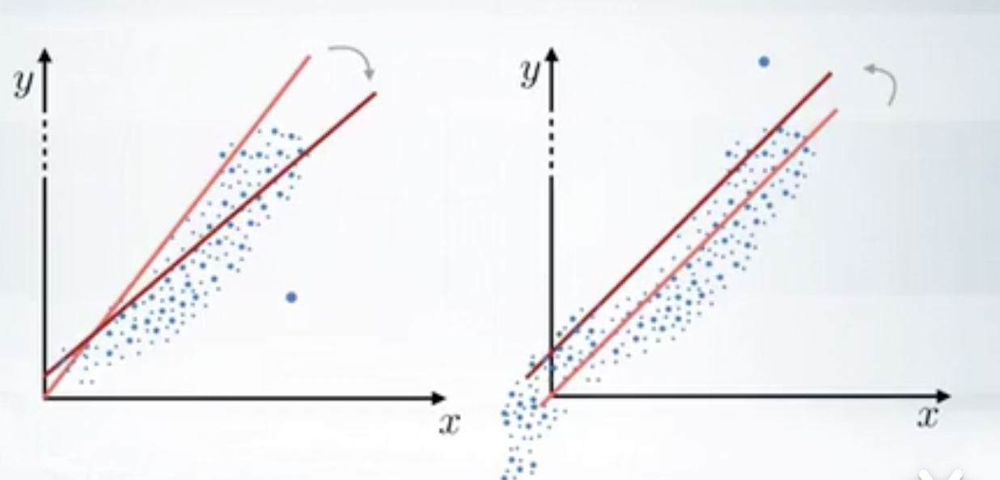

- To protect linear models from outliers, we can clip features values between two chosen values of lower bound and upper bound. We can choose them as some percentiles of that feature. For example, first and 99s percentiles. This procedure of clipping is well-known in financial data and it is called winsorization.

- Let's take a look at this histogram for an example. We see that the majority of feature values are between zero and 400. But there is a number of outliers with values around -1,000. They can make life a lot harder for our nice and simple linear model. Let's clip this feature's value range and to do so, first, we will calculate lower bound and upper bound values as features values at first and 99s percentiles. After we clip the features values, we can see that features distribution looks fine, and we hope now this feature will be more useful for our model.
 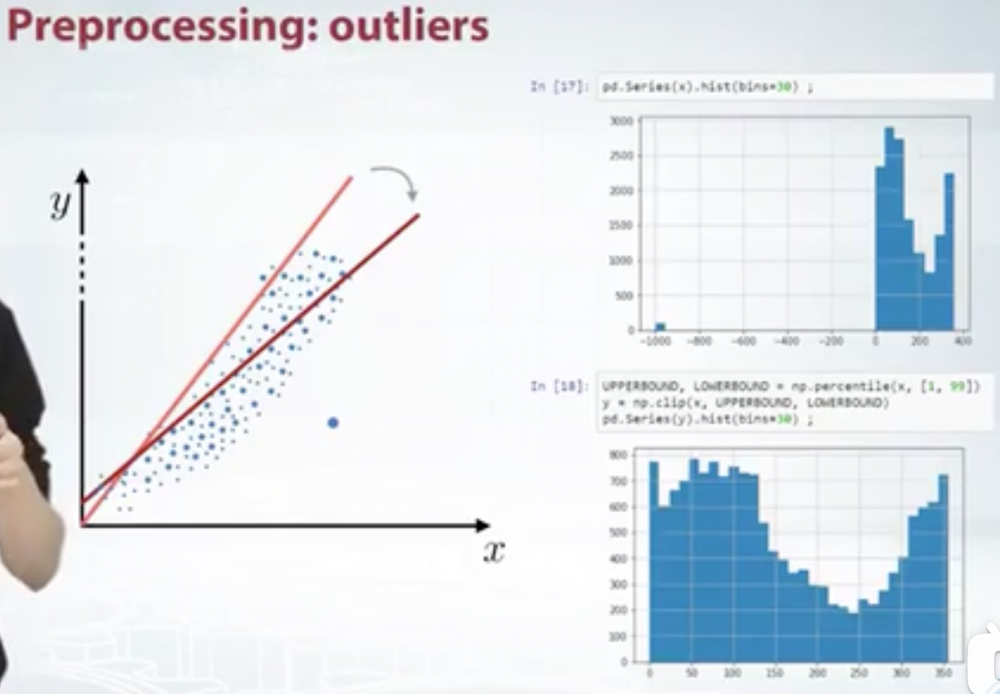

###### Rank Transformation
- Another effective preprocessing for numeric features is the rank transformation. Basically, it sets spaces between proper assorted values to be equal. This transformation, for example, can be a better option than MinMaxScaler if we have outliers, because rank transformation will move the outliers closer to other objects.

- Rank transformation gives the respective rank (index position) to the number in the array.
- Library implementation: scipy.stats.rankdata
- Linear models, KNN, and neural networks can benefit from this kind of transformation if we have no time to handle outliers manually.
- To apply rank transformation to test data, you need to store created rank mapping from feature values to rank values (obtained when we do rank transformation on train data).
- The lesson video says we can concatenate both train and test data before performing rank transformation, but wouldn't it lead to data leaking?

###### Log Transformation `np.log(1+x)`
- Often helps non-tree-based models, especially neural networks.

###### Square root Transformation `np.sqrt(x + 2/3)`
- Good for non-tree-based models, esprecially neural networks.
- Both log transformation and square root transformation drive too big values closer to the features' average value. So, the values near zero are more distinguishable.

###### Other tips:
- Sometimes, it is useful to train model using features transformed with multiple preprocessing techniques.
- kNN, linear models and neural networks might benefit hugely from this.



### Feature generation
- Process of creating new features using knowledge about the features and the task
- We can generate new features using prior knowldge and logic, however it is important to be able to derive information by analyzing the data.
- For example, if we already have real estate squared area and price feature, we can create another feature: price per square area.
 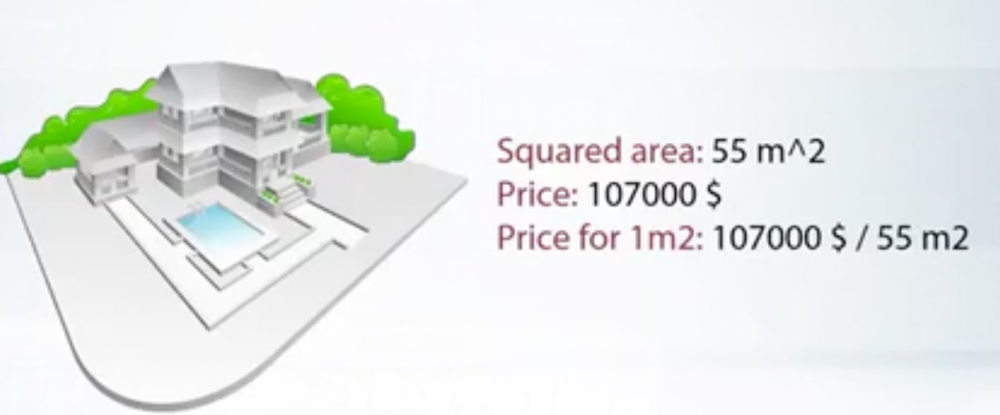
- Another example, from the Forest Cover Type Prediction dataset, if we have a horizontal distance to a water source and the vertical difference in heights within the point and the water source, then we could create another feature `combined` for the direct distance from the water source to the point.
 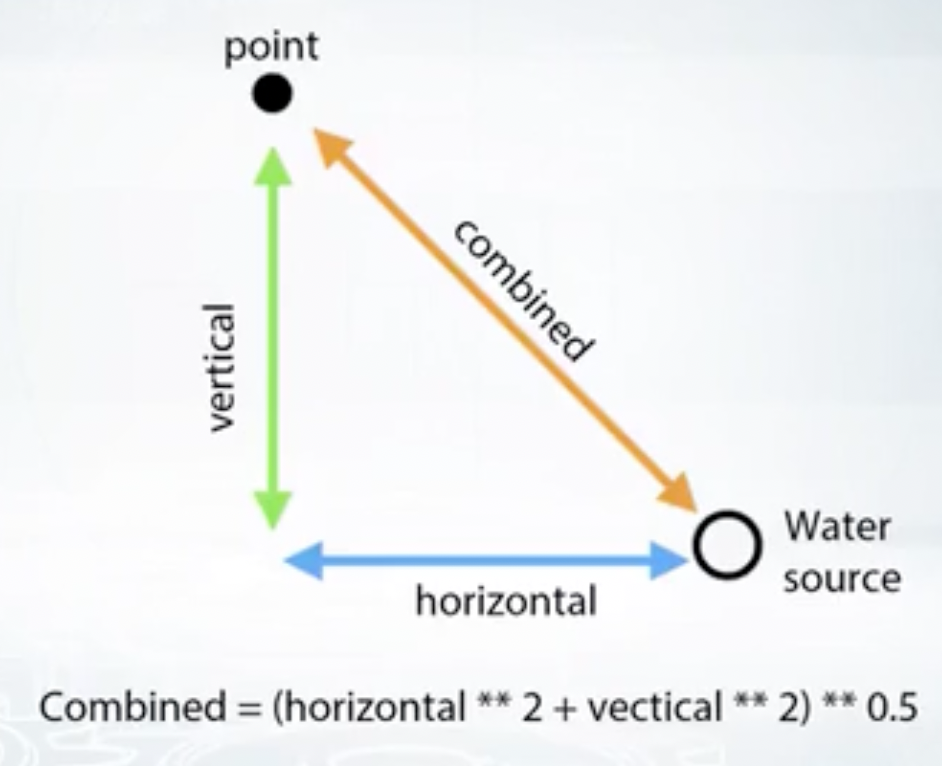
- Addition, multiplication, divisions and other feature interactions can be of help not only for linear models but also tree models.
- This is because, although gradient within decision tree is a very powerful model, it still experiences difficulties with approximation of multiplications and divisions. And adding these features explicitly can lead to a more robust model with less amount of trees.
- The third example of feature generation for numeric features is also very interesting. Sometimes, if we have prices of products as a feature, we can add new feature indicating fractional part of these prices. For example, if some product costs 2.49, the fractional part of its price is 0.49.
- This feature can help the model utilize the differences in people's perception of these prices.
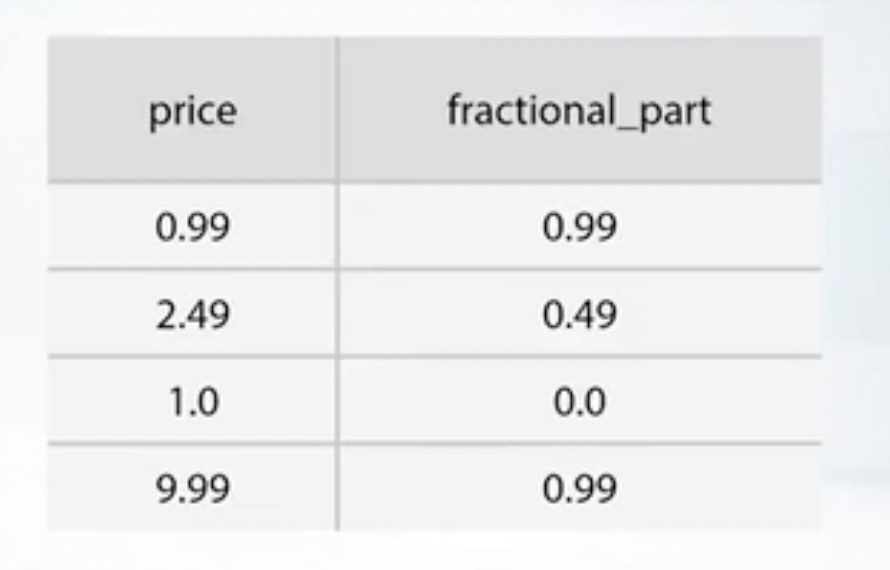
- Also, we can find similar patterns in tasks which require distinguishing between a human and a robot. For example, if we will have some kind of financial data like auctions, we could observe that people tend to set round numbers as prices, and there are something like 0.935xxxxx (very long number here).
- Or, if we are trying to find spambots on social networks, we can be sure that no human ever read messages with an exact interval of one second.



Conclusion
- Impact of feature preprocessing is different for different models
- Tree-based models don't depend on scaling, while non-tree-based models usually depend on them.
- We can treat scaling as an important hyper parameter in cases when the choice of scaling impacts predictions quality.
- Feature generation is powered by an understanding of the data.
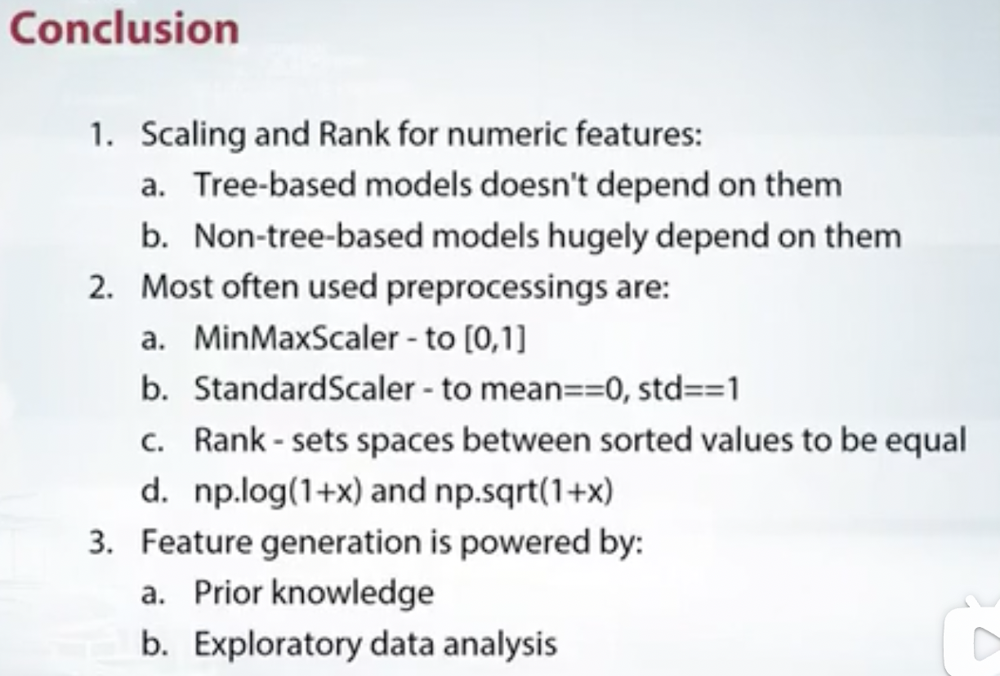

Additional resources:
- Feature transformation:
  - https://datascience.stackexchange.com/a/22546